In [2]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime as dt
import math

from keras.models import Sequential
from keras.regularizers import L1L2
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import Flatten
from keras.layers import TimeDistributed
#import pydot
from keras.utils.vis_utils import plot_model
#from keras.layers import Bidirectional
#from keras.layers import Dropout
tf.random.set_seed(42)

from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')
plt.style.use('seaborn-colorblind')
sns.set_theme()
%matplotlib inline

params = {'legend.fontsize': 'x-large',
          'figure.figsize': (20, 10),
          'figure.titlesize': 'x-large',
          'figure.dpi': 150,
         'axes.labelsize': 'x-large',
         'axes.titlesize': 'x-large',
         'xtick.labelsize': 'x-large',
         'ytick.labelsize': 'x-large',
         'savefig.bbox': 'tight'}

plt.rcParams.update(params)
# plt.rcParams.keys() ### Use to check the available parameters
#tf.debugging.set_log_device_placement(True) ### Use to debug use of GPU

# Data load

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
%run 'drive/My Drive/MONTA/ts_modelling.py'

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [6]:
df = pd.read_csv("drive/My Drive/MONTA/Spot_price_NO1.csv")
df = df[["price", "datetime"]]
df["datetime"] = pd.to_datetime(df["datetime"])
df.set_index("datetime", inplace = True)
data = df.iloc[:41592] # Keep untouched From October 2021


In [7]:
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out-1
        # check if we are beyond the dataset
        if out_end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

In [8]:
# General data normalization
p_min = data.min()
p_max = data.max()
ndata = (data-p_min)/(p_max-p_min)

# Modelling

## Forecasting


Input (Kernel) regularization documentation: https://keras.io/api/layers/regularizers/

MAE (L1 Loss):  https://angela-wong.medium.com/rmse-or-mae-which-and-why-loss-functions-used-in-regression-and-classification-a98afc9fa215

In [9]:
train_size = 1968
test_size = 96
folds = 20
n_steps_in = 168
n_steps_out = 96
indexes=[]
preds = []
hists=[]
for ii, tr, te in datagen(train_size, test_size, folds):
    # Define data
    in_seq = ndata[tr:te].values
    x_input = ndata[te-n_steps_in:te].values  # Last sequence of in_seq, to use for prediction
    y_true = ndata[te:te+n_steps_out] # Values to be predicted
    # convert to [rows, columns] structure
    in_seq = in_seq.reshape((len(in_seq), 1))
    #in_seq2 = in_seq2.reshape((len(in_seq2), 1))
    #out_seq = out_seq.reshape((len(out_seq), 1))
    dataset=np.hstack((in_seq, in_seq))
    X, y = split_sequences(dataset, n_steps_in, n_steps_out)
    n_features= X.shape[2]   
    model = Sequential()
    model.add(LSTM(168, input_shape=(n_steps_in, n_features), return_sequences=True)) #kernel_regularizer=L1L2(l1=0.001, l2=0.001)))
    model.add(Flatten())
    model.add(Dense(n_steps_out)) # Since it is not a batch-like processing,
                                  # the output needs to be of the correct time-steps.
    model.compile(optimizer='adam', loss='mae', metrics=['mae', 'mse']) # L1 Loss - better because it penalizes outliers.
    print(f'Fold {ii}')
    print(X.shape,"\n")
    print(y.shape)
    history=model.fit(X, y, epochs=1, verbose=1, validation_split=0.2)
    hists.append(history)    
    # with open(f'modelsummary_Fold_{ii}.txt', 'w') as f:
    #    model.summary(print_fn=lambda x: f.write(x + '\n'))


    x_input = x_input.reshape((1, n_steps_in, n_features))
    preds.append([model.predict(x_input, verbose=0)]) # Save predictions for evaluation: rmse, mape...
    #with open(f"preds_fold_{ii}.txt", "w") as output:
    #    output.write(str(preds))   # Save predictions in case memory breaks
    indexes.append([te, te+test_size]) # Save indexes for plotting
    if ii == 1: break

Fold 1
(1706, 168, 1) 

(1706, 96)
43/43 [==============================] - 9s 37ms/step - loss: 0.0158 - mae: 0.0158 - mse: 7.8221e-04 - val_loss: 0.0080 - val_mae: 0.0080 - val_mse: 1.2930e-04


In [ ]:
def plot_history(history: tf.keras.callbacks.History, fold) -> None:
  """
  Plot training vs Validation MAE and MSE over epoch
  """
  hist=pd.DataFrame(history.history)
  hist['epoch'] = history.epoch

  fig, axes = plt.subplots(nrows=1, ncols=2)
  fig.suptitle(f'Train vs Validation errors - MAE & MSE Period {ii+1}')
  axes[0].set_xlabel('Epoch')
  axes[0].set_ylabel('Mean Abs Error [$€/MWh$]');
  axes[0].plot(hist['epoch'], hist['mae'], label='Train error')
  axes[0].plot(hist['epoch'], hist['val_mae'], 'C2', label='Validation error')
  axes[0].legend()
  
  axes[1].set_xlabel('Epoch')
  axes[1].set_ylabel('Mean Squared Error [$€^2/MWh^2$]');
  axes[1].plot(hist['epoch'], hist['mse'], label='Train error')
  axes[1].plot(hist['epoch'], hist['val_mse'], 'C2', label='Validation error')
  axes[1].legend()

  
  plt.legend()
  plt.savefig(f'drive/My Drive/MONTA/Plots/Train_Val_errors_period_{ii+1}.jpg')
  plt.show()
  print("\n")
for ii in range(3):
  plot_history(hists[ii], ii)

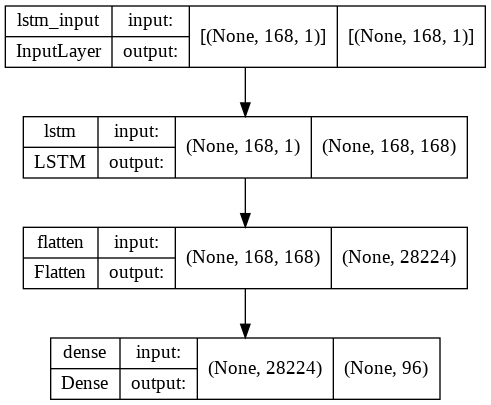

In [10]:
plot_model(model, to_file='drive/My Drive/MONTA/Plots/Model_LSTM_3_kernel_L1L2reg.png', show_shapes=True, show_layer_names=True)

In [ ]:
model.summary()

Model: "sequential_53"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_61 (LSTM)              (None, 168, 300)          362400    
                                                                 
 flatten_53 (Flatten)        (None, 50400)             0         
                                                                 
 dense_53 (Dense)            (None, 96)                4838496   
                                                                 
Total params: 5,200,896
Trainable params: 5,200,896
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.save(f'drive/My Drive/MONTA/LSTM_2_L1L2_reg Fold {ii+1}')

INFO:tensorflow:Assets written to: drive/My Drive/MONTA/LSTM_2_L1L2_reg Fold 21/assets


INFO:tensorflow:Assets written to: drive/My Drive/MONTA/LSTM_2_L1L2_reg Fold 21/assets


In [ ]:
preds

[[array([[0.12269652, 0.12123239, 0.1202488 , 0.1197945 , 0.12042131,
          0.12047815, 0.12130031, 0.12590186, 0.12785102, 0.13221966,
          0.1338643 , 0.13338715, 0.13110526, 0.1289892 , 0.12640417,
          0.1262238 , 0.12497394, 0.12535082, 0.1258917 , 0.1274604 ,
          0.1289384 , 0.12857829, 0.12761395, 0.12754488, 0.12433846,
          0.12610944, 0.12397401, 0.12350427, 0.12328359, 0.12333535,
          0.12375191, 0.12656823, 0.12916571, 0.1309991 , 0.13313434,
          0.13238397, 0.13053776, 0.1298561 , 0.12721416, 0.12595898,
          0.12613428, 0.12783042, 0.12801644, 0.1277571 , 0.12835214,
          0.1295452 , 0.12846082, 0.12876466, 0.12621175, 0.12493348,
          0.12280699, 0.12267748, 0.12261885, 0.12286215, 0.12433757,
          0.12733477, 0.1288113 , 0.13239437, 0.13353972, 0.13253187,
          0.12966818, 0.12887299, 0.12689498, 0.12512681, 0.1251051 ,
          0.12516797, 0.1253146 , 0.12786372, 0.12857549, 0.12811258,
          0.12734312

## Data checks

In [ ]:
in_seq

array([[29.36],
       [29.4 ],
       [28.91],
       ...,
       [30.05],
       [29.83],
       [29.5 ]])

In [ ]:
x_input.size

168

In [ ]:
out_seq.size # Number of sequences in each fold

10

In [ ]:
out_seq[0].size # Check size of each array

1

In [ ]:
X   # Number of aarrays depends on number of features
# Array format allows to have other input features (exog)

array([[[29.36],
        [29.4 ],
        [28.91],
        ...,
        [30.83],
        [30.95],
        [30.55]],

       [[29.4 ],
        [28.91],
        [28.11],
        ...,
        [30.95],
        [30.55],
        [29.89]],

       [[28.91],
        [28.11],
        [28.24],
        ...,
        [30.55],
        [29.89],
        [29.56]],

       ...,

       [[30.74],
        [30.18],
        [29.71],
        ...,
        [31.04],
        [30.56],
        [29.91]],

       [[30.18],
        [29.71],
        [29.25],
        ...,
        [30.56],
        [29.91],
        [29.72]],

       [[29.71],
        [29.25],
        [28.88],
        ...,
        [29.91],
        [29.72],
        [29.39]]])

In [ ]:
X[0].size

168

In [ ]:
y

array([[30.55, 29.89, 29.56, ..., 29.88, 29.5 , 29.43],
       [29.89, 29.56, 29.11, ..., 29.5 , 29.43, 29.21],
       [29.56, 29.11, 28.99, ..., 29.43, 29.21, 28.83],
       ...,
       [29.91, 29.72, 29.39, ..., 31.38, 30.66, 30.05],
       [29.72, 29.39, 29.52, ..., 30.66, 30.05, 29.83],
       [29.39, 29.52, 29.42, ..., 30.05, 29.83, 29.5 ]])

In [ ]:
y[0].size

96

In [ ]:
n_features

168

In [ ]:
n_features=X.shape[2]

In [ ]:
n_features

1

## Evaluation

### De-Normalization

In [ ]:
# Remove list(array(list(list(value))) structure...
predsd = [(val * (p_max - p_min) + p_min) for matrix in preds
          for sublist in matrix
          for subsublist in sublist
          for val in subsublist]
         #for val in arr]
# Correct number of folds -> Match folds performed prediction
#predsd = [[predsd[j] for j in range(96)] for i in range(folds)]


arr_prices=np.array(predsd).reshape([20, 96])
print(arr_prices[0].shape)
print(predsd)

(96,)
[price    29.772331
dtype: float64, price    29.396416
dtype: float64, price    29.14388
dtype: float64, price    29.027239
dtype: float64, price    29.188172
dtype: float64, price    29.202764
dtype: float64, price    29.413855
dtype: float64, price    30.595303
dtype: float64, price    31.09575
dtype: float64, price    32.217397
dtype: float64, price    32.639659
dtype: float64, price    32.51715
dtype: float64, price    31.931275
dtype: float64, price    31.387978
dtype: float64, price    30.72427
dtype: float64, price    30.677961
dtype: float64, price    30.357059
dtype: float64, price    30.453823
dtype: float64, price    30.592694
dtype: float64, price    30.995459
dtype: float64, price    31.374936
dtype: float64, price    31.282476
dtype: float64, price    31.034881
dtype: float64, price    31.017148
dtype: float64, price    30.1939
dtype: float64, price    30.648598
dtype: float64, price    30.100327
dtype: float64, price    29.97972
dtype: float64, price    29.923061
d

In [ ]:
indexes # Check

[[1968, 2064],
 [4032, 4128],
 [6096, 6192],
 [8160, 8256],
 [10224, 10320],
 [12288, 12384],
 [14352, 14448],
 [16416, 16512],
 [18480, 18576],
 [20544, 20640],
 [22608, 22704],
 [24672, 24768],
 [26736, 26832],
 [28800, 28896],
 [30864, 30960],
 [32928, 33024],
 [34992, 35088],
 [37056, 37152],
 [39120, 39216],
 [41184, 41280]]

### Plotting

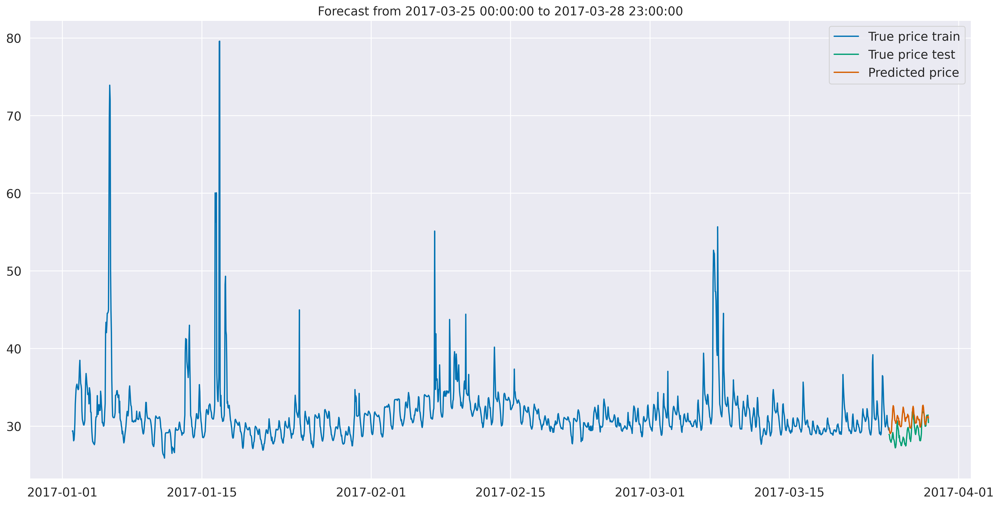

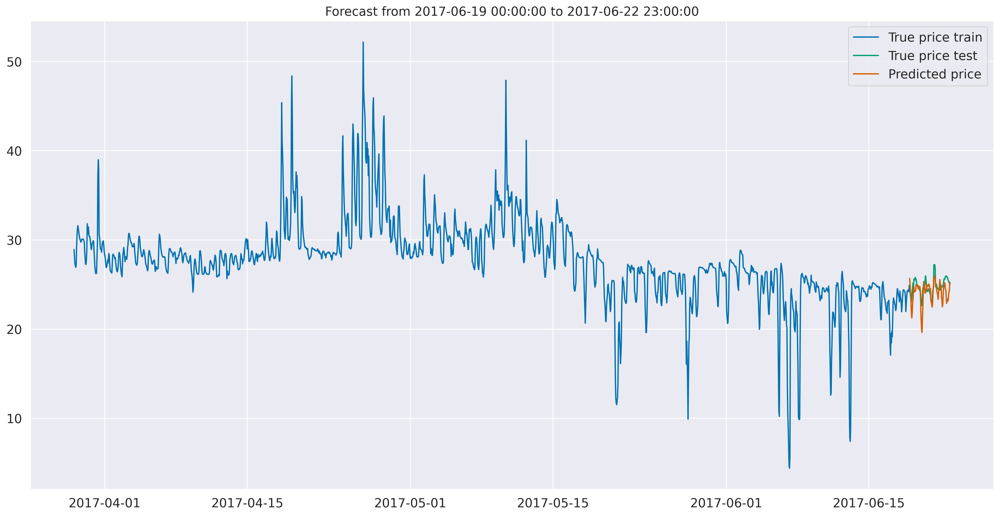

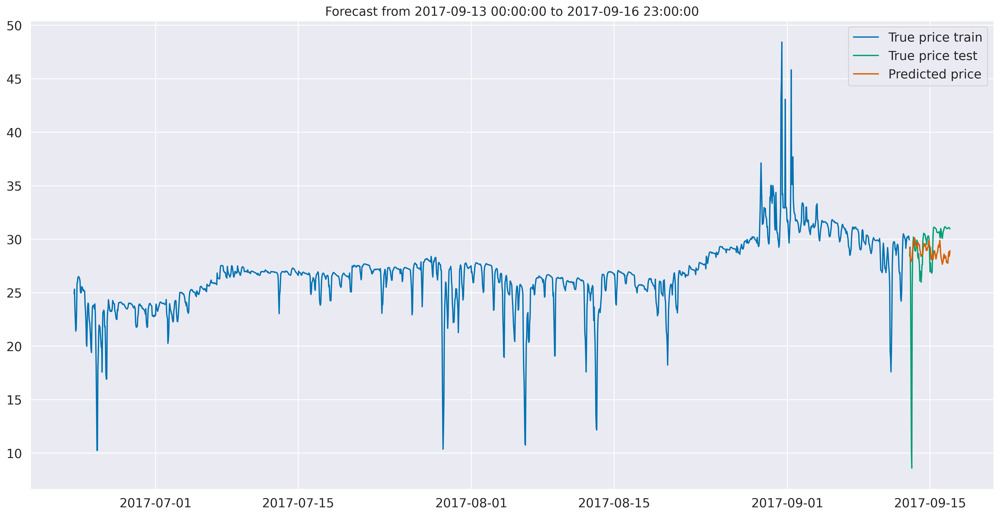

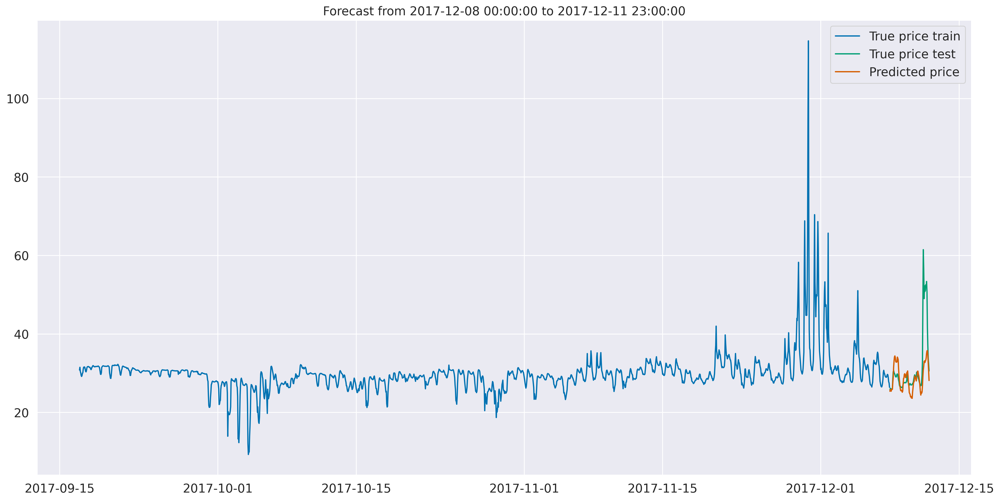

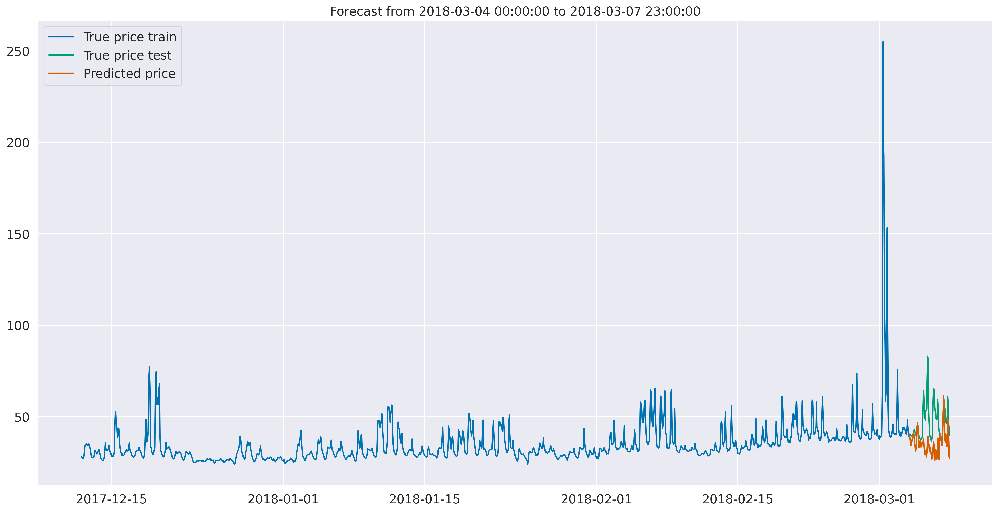

...

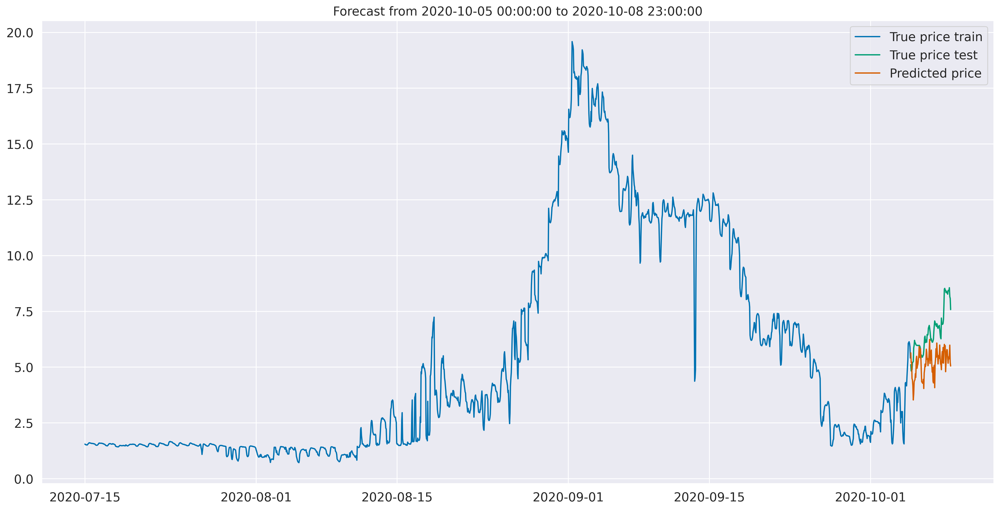

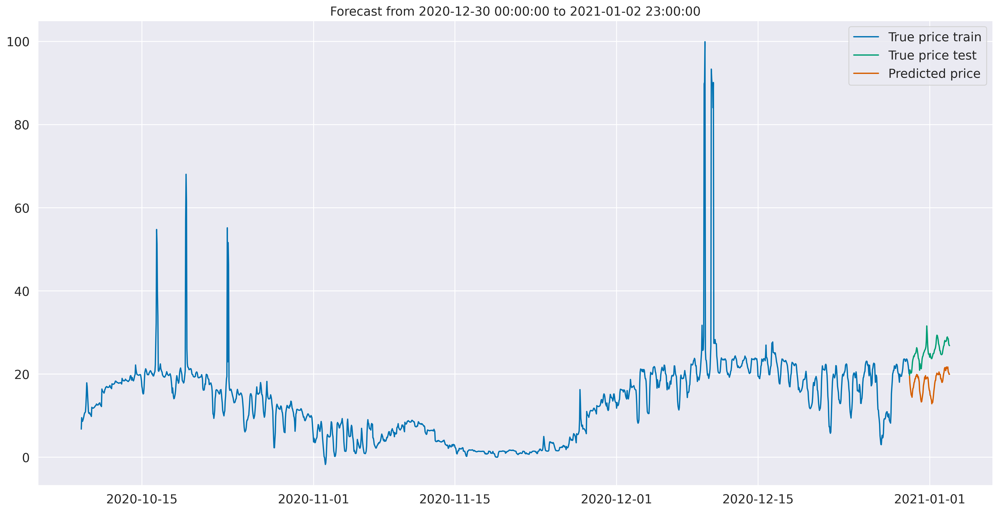

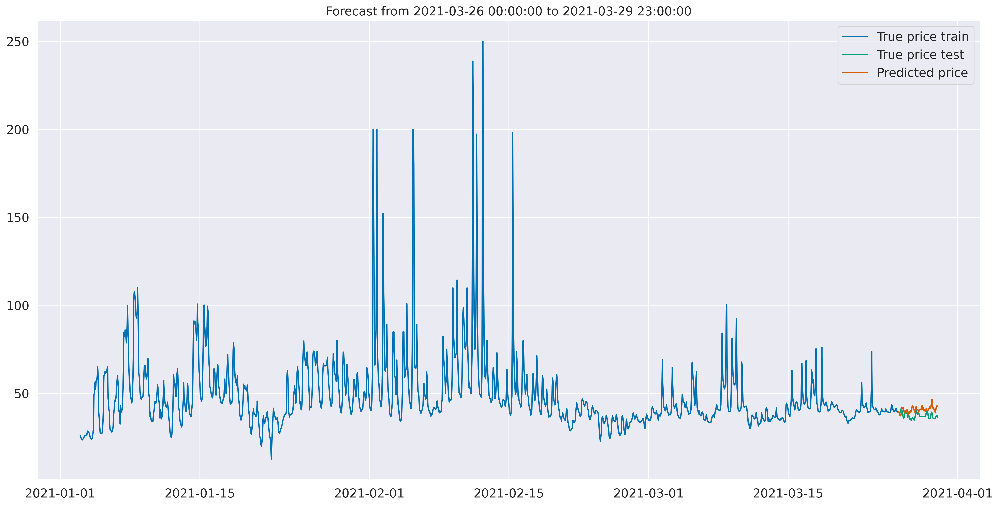

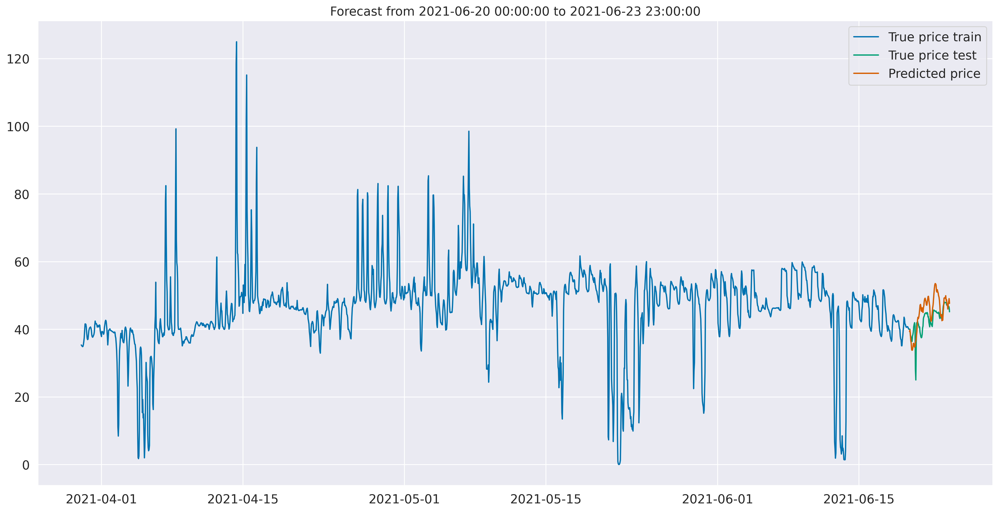

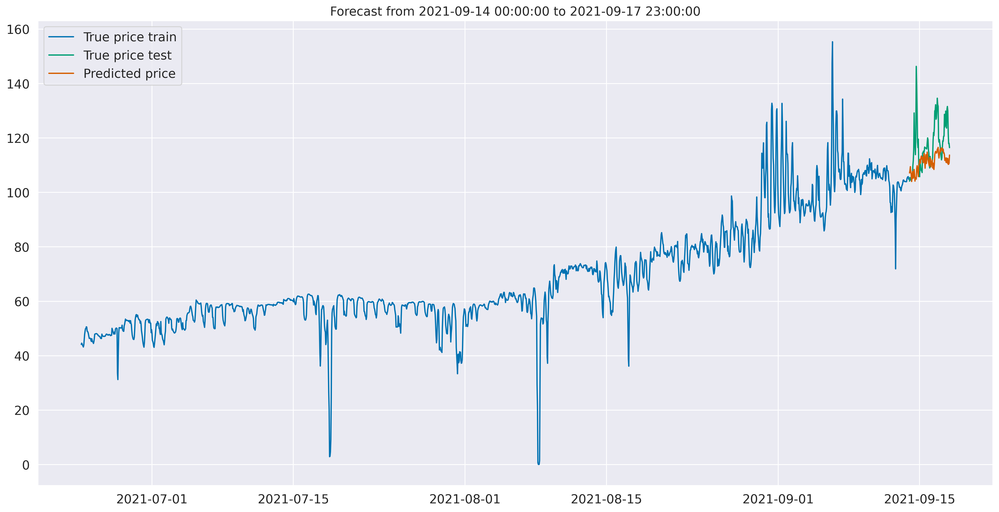

In [ ]:
plt.rcParams.update(params)

for ii in range(folds):
#    if ii == 3:
#        break
    fig = plt.figure(figsize=(20,10))
    plt.plot(data[(indexes[ii][0]-train_size):indexes[ii][0]], label = "True price train")
    plt.plot(data[indexes[ii][0]:indexes[ii][1]], label = "True price test")
    #len(data[indexes[0][0]:indexes[0][1]].index)
    plt.plot(data[indexes[ii][0]:indexes[ii][1]].index, arr_prices[ii], label = "Predicted price")
    plt.title(f'Forecast from {data[indexes[ii][0]:indexes[ii][1]].index[0]} to {data[indexes[ii][0]:indexes[ii][1]].index[-1]}')
    plt.legend()
    fig.savefig(f'drive/My Drive/MONTA/Plots/Pred LSTM_3_mae_L1L2_reg Fold {ii+1}.jpg')
    plt.show()   

### RMSE

In [ ]:
###### De-normalized RMSE ######
rmse = []
rmse = [(np.sqrt(mean_squared_error(
    data[indexes[ii][0]:indexes[ii][1]], arr_prices[ii])))
                 for ii in range(folds)]
rmse[0] # Check that it is not in the 0.01 range

1.9941705706880033

In [ ]:
predsd=arr_prices.copy()

Fold 1 has  a MAPE of 6.72 % and an RMSE of 1.9942
Fold 2 has  a MAPE of 4.99 % and an RMSE of 1.2375
Fold 3 has  a MAPE of 10.02 % and an RMSE of 3.3403
Fold 4 has  a MAPE of 14.97 % and an RMSE of 7.1351
Fold 5 has  a MAPE of 24.76 % and an RMSE of 15.5006
Fold 6 has  a MAPE of 10.83 % and an RMSE of 4.379
Fold 7 has  a MAPE of 4.23 % and an RMSE of 2.3588
Fold 8 has  a MAPE of 7.54 % and an RMSE of 2.266
Fold 9 has  a MAPE of 4.65 % and an RMSE of 2.1945
Fold 10 has  a MAPE of 4.47 % and an RMSE of 2.1913
Fold 11 has  a MAPE of 5.56 % and an RMSE of 1.9774
Fold 12 has  a MAPE of 6.99 % and an RMSE of 3.1511
Fold 13 has  a MAPE of 8.38 % and an RMSE of 1.6443
Fold 14 has  a MAPE of 15.79 % and an RMSE of 0.8793
Fold 15 has  a MAPE of 16.86 % and an RMSE of 0.3257
Fold 16 has  a MAPE of 20.92 % and an RMSE of 1.6477
Fold 17 has  a MAPE of 28.25 % and an RMSE of 7.5169
Fold 18 has  a MAPE of 9.29 % and an RMSE of 4.0462
Fold 19 has  a MAPE of 13.77 % and an RMSE of 4.5359
Fold 20 has  

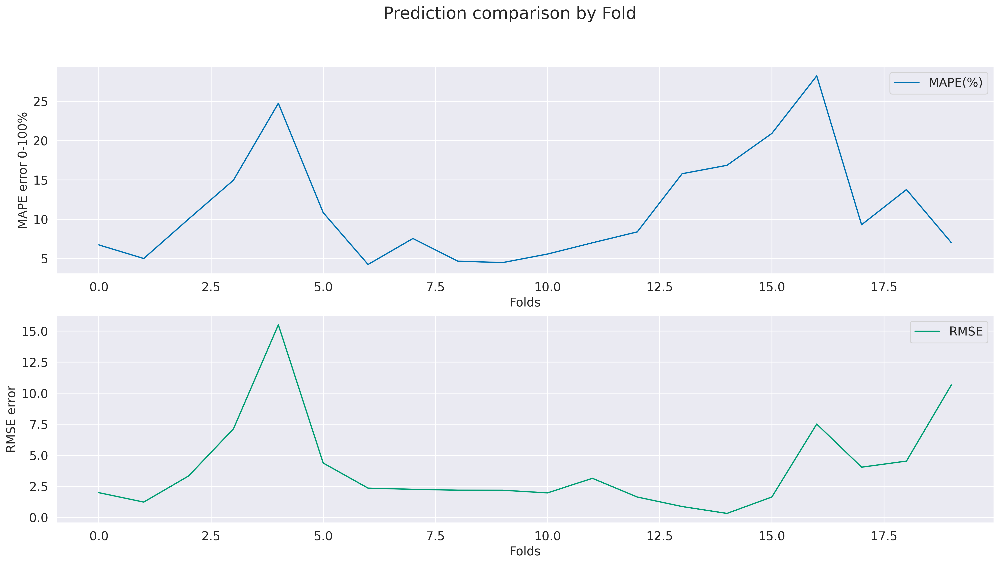

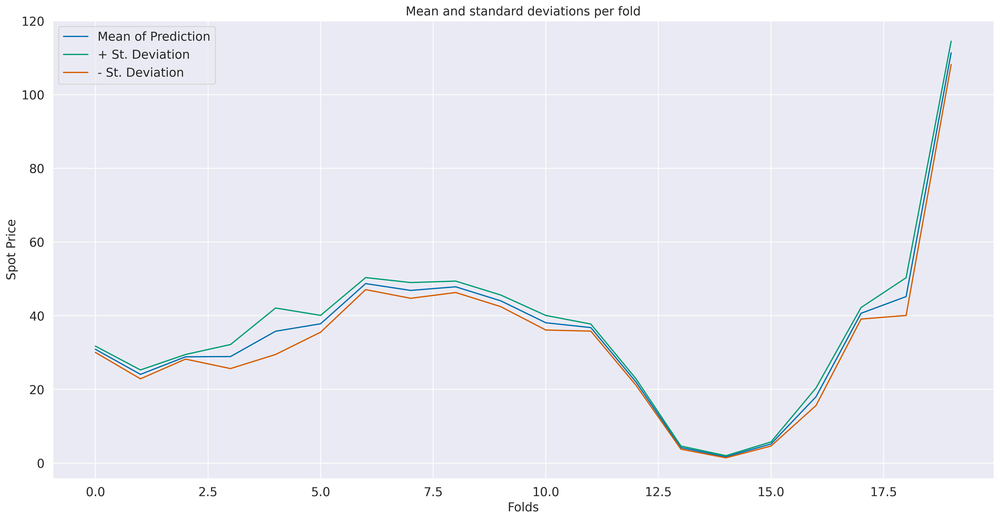

In [ ]:
mape =[]
means = []
stdup = []
stddown = []
for ii in range(folds):
    val = calculate_mape(data[indexes[ii][0]:indexes[ii][1]], predsd[ii])
    mape.append(val)
    means.append(np.mean(predsd[ii]))
    stdup.append(np.mean(predsd[ii]) + np.std(predsd[ii]))
    stddown.append(np.mean(predsd[ii]) - np.std(predsd[ii]))
    print(f'Fold {ii+1} has  a MAPE of {val} % and an RMSE of {round(rmse[ii], 4)}')
print(f' Average MAPE: {np.mean(mape)}')
print(f' Average RMSE: {np.mean(rmse)}')

plt.rcParams.update(params)

###### Error Plots ######    
fig, (ax1, ax2) = plt.subplots(2, 1)
plt.suptitle("Prediction comparison by Fold", fontsize=20)
ax1.set_xlabel('Folds')
ax1.set_ylabel('MAPE error 0-100%')
#a, = ax1.plot(mape, "C0", label = "MAPE(%)")
ax1.plot(mape, "C0", label = "MAPE(%)")
ax1.legend(loc='best')
ax2.plot(rmse, "C2", label = "RMSE")
ax2.set_ylabel("RMSE error")
ax2.set_xlabel("Folds")
ax2.legend(loc='best')
plt.savefig(f'drive/My Drive/MONTA/Plots/Pred LSTM_3_mae_L1L2_reg Errors per Fold.jpg')
plt.show()

###### Prediction Plots ######
fig3, ax3 = plt.subplots()   
ax3.set_xlabel('Folds') 
ax3.set_ylabel('Spot Price') 
ax3.plot(means, label = "Mean of Prediction")
ax3.plot((stdup), label = "+ St. Deviation")
ax3.plot((stddown), label = "- St. Deviation")
plt.title("Mean and standard deviations per fold")
plt.legend()
plt.savefig(f'drive/My Drive/MONTA/Plots/Pred LSTM_3_mae_L1L2_reg Mean and standard deviation.jpg')
plt.show()

### Time-related

In [ ]:
preds_values = [(val * (p_max - p_min) + p_min) for matrix in preds
          for sublist in matrix
          for subsublist in sublist
          for val in subsublist]
preds_idx = [data[idx_rng[0]:idx_rng[1]].index for idx_rng in indexes]
preds_idx = [pd.to_datetime(val) for matrix in preds_idx
          for val in matrix]
#preds_idx

In [ ]:
preds_df = pd.DataFrame(data=preds_values, index = preds_idx)
preds_df.reset_index(inplace = True)
preds_df.columns = ["datetime", "Predicted Price"]
preds_df["hour"] = preds_df["datetime"].dt.hour
preds_df["dayofweek"] = preds_df["datetime"].dt.weekday
#true_test = data.reset_index()
preds_df = preds_df.merge(data, how = "left", on = "datetime")
# Square root of the incremental mean of the difference
preds_df["RMSE"] = np.sqrt(((preds_df["Predicted Price"] - preds_df.price)**2).expanding().mean()) 

In [ ]:
drive_path='drive/My Drive/MONTA/'
folder = "Plots/"
subfolder = "LSTM_3_L1L2_reg/"
filename = "/Preds_2_mae_L1L2_reg"
filetype = ".csv"
preds_df.to_csv(path_or_buf=drive_path+folder+subfolder+filename+filetype)
preds_df.head() # Data check

,datetime,Predicted Price,hour,dayofweek,price,RMSE
0,2017-03-25 00:00:00,29.772331,0,5,28.93,0.842331
1,2017-03-25 01:00:00,29.396416,1,5,28.82,0.721726
2,2017-03-25 02:00:00,29.143880,2,5,28.34,0.750111
3,2017-03-25 03:00:00,29.027239,3,5,28.17,0.778277
4,2017-03-25 04:00:00,29.188172,4,5,28.03,0.867666


hour
0     4.987302
1     4.982795
2     4.980377
3     4.979581
4     4.983355
5     4.987716
6     4.986710
7     4.988271
8     4.993101
9     5.003982
10    5.013362
11    5.021487
12    5.027723
13    5.031558
14    5.033927
15    5.037038
16    5.040961
17    5.044281
18    5.047958
19    5.051316
20    5.052885
21    5.051291
22    5.049214
23    5.046856
Name: RMSE, dtype: float64

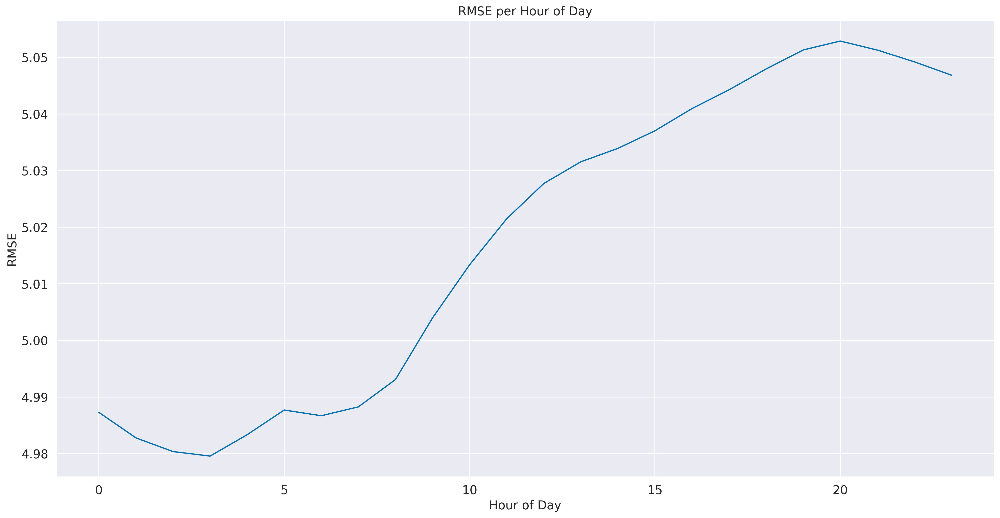

In [ ]:
hour_preds = preds_df.groupby("hour")["RMSE"].mean()
display(hour_preds)
plt.plot(hour_preds,"C0")
plt.xlabel('Hour of Day') 
plt.ylabel('RMSE') 
plt.title("RMSE per Hour of Day")
plt.savefig(f'drive/My Drive/MONTA/Plots/LSTM_3_mae_L1L2_reg Hourly error.jpg')
plt.show()

dayofweek
0    4.720818
1    5.209677
2    5.206838
3    5.144573
4    5.169324
5    4.755268
6    4.909215
Name: RMSE, dtype: float64

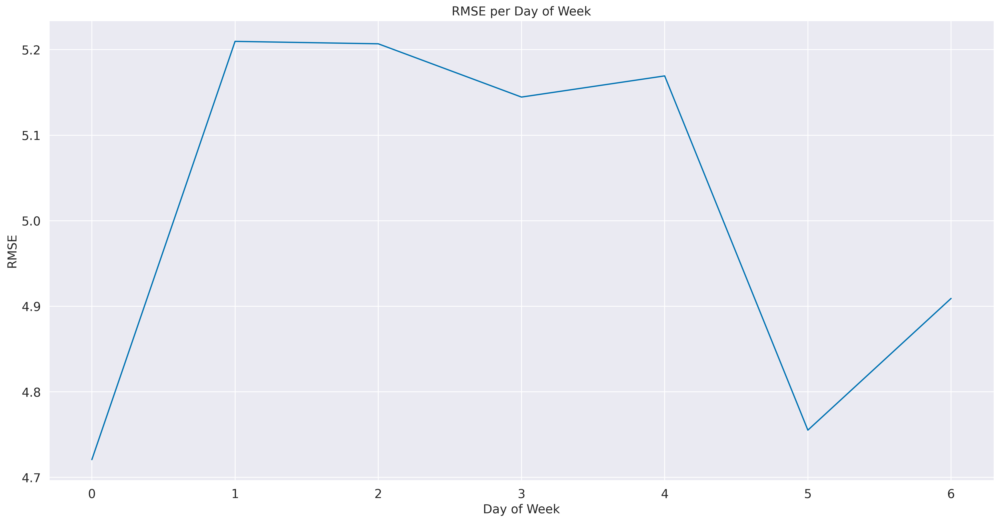

In [ ]:
preds_df["dayofweek"] = preds_df["datetime"].dt.dayofweek
weekday_preds = preds_df.groupby("dayofweek")["RMSE"].mean()
display(weekday_preds)
plt.plot(weekday_preds,"C0")
plt.xlabel('Day of Week') 
plt.ylabel('RMSE') 
plt.title("RMSE per Day of Week")
plt.savefig(f'drive/My Drive/MONTA/Plots/LSTM_3_mae_L1L2_reg Day of Week error.jpg')
plt.show()

dayofweek,0,1,2,3,4,5,6
hour,,,,,,,
0,4.606416,5.184697,5.172468,5.164337,5.183694,4.685578,4.913773
1,4.602267,5.181741,5.169149,5.162032,5.181472,4.672349,4.910124
2,4.598466,5.178896,5.165917,5.159492,5.179040,4.672994,4.907639
3,4.595199,5.176380,5.171913,5.157336,5.176873,4.673469,4.905469
4,4.592468,5.174956,5.201339,5.155063,5.174844,4.679503,4.903610
5,4.590483,5.174716,5.231858,5.153142,5.173006,4.685183,4.902543
6,4.588502,5.174204,5.230250,5.151249,5.171307,4.686906,4.901568
7,4.587861,5.173413,5.227416,5.149172,5.170183,4.705882,4.901800
8,4.608218,5.178729,5.224663,5.147304,5.168828,4.717765,4.903263


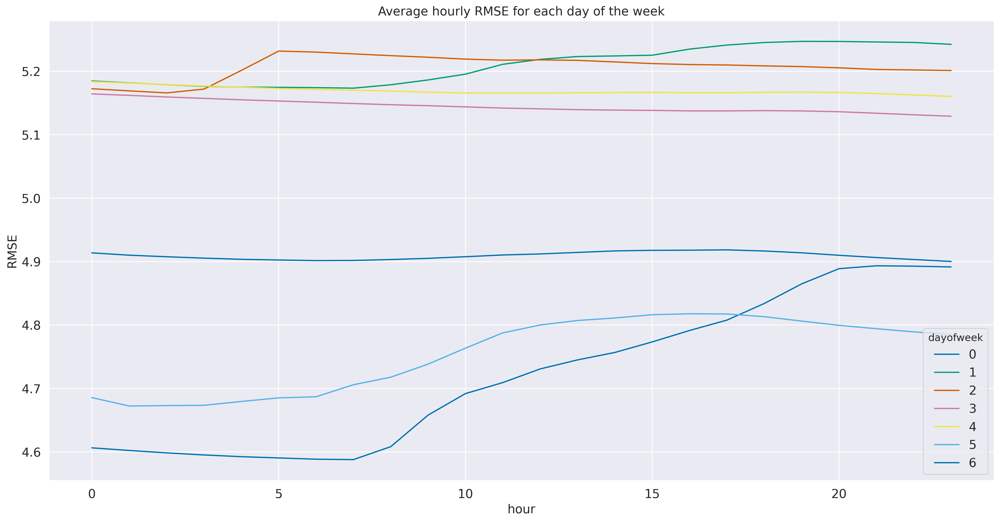

In [ ]:
hour_day = pd.pivot_table(data = preds_df, values="RMSE",
                            index = "hour", columns="dayofweek",
                            aggfunc="mean")
display(hour_day)
hour_day.plot()
plt.ylabel("RMSE")
plt.title("Average hourly RMSE for each day of the week")
plt.savefig(f'drive/My Drive/MONTA/Plots/LSTM_3_mae_L1L2_reg Average hourly RMSE for each day.jpg')
plt.show()